# Дискретные случайные процессы и временные ряды, DS-поток
## Задание TS.3
### Временные ряды. Модели типа ARIMA.

**Правила:**

* Дедлайны см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Выполненную работу нужно отправить телеграм-боту `@miptstats_ds24_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. Дождитесь подтверждения от бота, что он принял файл. Если подтверждения нет, то что-то не так. **Работы, присланные иным способом, не принимаются.**
* Прислать нужно **ноутбук в формате `ipynb`**.
* Следите за размером файлов. **Бот не может принимать файлы весом более 20 Мб.** Если файл получается больше, заранее разделите его на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания получат штраф.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания используйте этот ноутбук в качестве основы, ничего не удаляя из него. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*
* В каждой задаче не забывайте делать **пояснения и выводы**.
* **Код из рассказанных на занятиях ноутбуков** можно использовать без ограничений.

**Правила оформления теоретических задач:**

* Решения необходимо прислать одним из следующих способов:
  * фотографией в правильной ориентации, где все четко видно, а почерк разборчив,
    * отправив ее как файл боту вместе с ноутбуком *или*
    * вставив ее в ноутбук посредством `Edit -> Insert Image` (<font color="red">фото, вставленные ссылкой, не принимаются</font>);
  * в виде $LaTeX$ в markdown-ячейках.
* Решения не проверяются, если какое-то требование не выполнено. Особенно внимательно все проверьте в случае выбора второго пункта (вставки фото в ноутбук). <font color="red"><b>Неправильно вставленные фотографии могут не передаться при отправке.</b></font> Для проверки попробуйте переместить `ipynb` в другую папку и открыть его там.
* В решениях поясняйте, чем вы пользуетесь, хотя бы кратко. Например, если пользуетесь независимостью, то достаточно подписи вида "*X и Y незав.*"
* Решение, в котором есть только ответ, и отсутствуют вычисления, оценивается в 0 баллов.


**Баллы за задание.** 
  * Задача 1 &mdash; 150 баллов.

<b><font size="5">Дорешка:</font></b>

* <b><font size="4">Задача 1</font></b>
  * <b><font color="#f09000" size="3">Добавил работу (с нуля) :((</font></b>

In [1]:
import warnings

warnings.filterwarnings("ignore")

import itertools

import numpy as np
import pandas as pd
import scipy.stats as sps

from statsforecast import StatsForecast
from statsforecast.models import AutoARIMA
from statsforecast.arima import arima_string
from statsforecast.models import (
    SimpleExponentialSmoothing,
    SimpleExponentialSmoothingOptimized,
)

import statsmodels
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.stats.multitest import multipletests
from statsmodels.stats.proportion import proportion_confint
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsmodels.tsa.holtwinters import (
    ExponentialSmoothing,
    SimpleExpSmoothing,
    Holt,
)

from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    mean_absolute_percentage_error,
)
from sklearn.preprocessing import StandardScaler

from tbats import TBATS, BATS

from prophet import Prophet
from pmdarima import auto_arima

import matplotlib.pyplot as plt
from pylab import rcParams
import seaborn as sns
import plotly.graph_objects as go
from tqdm.auto import tqdm
from dateutil.parser import parse

rcParams["figure.figsize"] = 15, 7
sns.set(palette="Set2", font_scale=1.3)

In [2]:
#!pip install statsforecast tbats prophet pmdarima

In [3]:
# Bot check

# HW_ID: ds_ts3
# Бот проверит этот ID и предупредит, если случайно сдать что-то не то.

# Status: final
# Перед отправкой в финальном решении удали "not" в строчке выше.
# Так бот проверит, что ты отправляешь финальную версию, а не промежуточную.
# Никакие значения в этой ячейке не влияют на факт сдачи работы.

### Задача 1

__1.__ Загрузите файл `electricity.csv` (<a href="https://rdrr.io/cran/stR/man/electricity.html">источник</a>) c информацией о максимальном спросе на электричество (`Consumption`) в штате Виктория (Австралия) за 30-минутные интервалы с 10 января 2000 в течении 115 дней, а так же информация о температуре воздуха (`Temperature`) за эти же промежутки времени.

In [4]:
data = pd.read_csv("electricity.txt")
data.drop(columns=["Unnamed: 0", "Time"], inplace=True)
data["Time"] = pd.date_range(
    start="2000-01-10", periods=len(data), freq="30T"
)
data.head()

,Consumption,Temperature,DailySeasonality,WeeklySeasonality,Time
0,3853.475392,20.90,0,48,2000-01-10 00:00:00
1,3683.014105,20.70,1,49,2000-01-10 00:30:00
2,3912.324031,20.50,2,50,2000-01-10 01:00:00
3,3783.881181,20.05,3,51,2000-01-10 01:30:00
4,3554.257244,19.60,4,52,2000-01-10 02:00:00


__2.__ Нарисуйте графики временных рядов температуры и потребления электричества. Верно ли, что спрос на электричество зависит от температуры воздуха? Для ответа на вопрос используйте коэффициенты корреляции, учитывая условия их применимости.

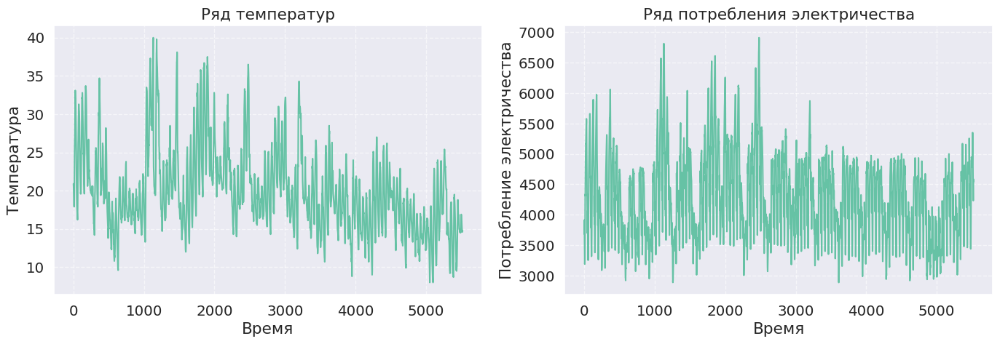

In [5]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))  # Две оси в одной строке

axes[0].plot(data["Temperature"])
axes[0].set_title("Ряд температур")
axes[0].set_xlabel("Время")
axes[0].set_ylabel("Температура")
axes[0].grid(True, linestyle="--", alpha=0.6)

axes[1].plot(data["Consumption"])
axes[1].set_title("Ряд потребления электричества")
axes[1].set_xlabel("Время")
axes[1].set_ylabel("Потребление электричества")
axes[1].grid(True, linestyle="--", alpha=0.6)

plt.tight_layout()
plt.show()

Посмотрим на корреляцию, сначала 

Text(0, 0.5, 'Температура')

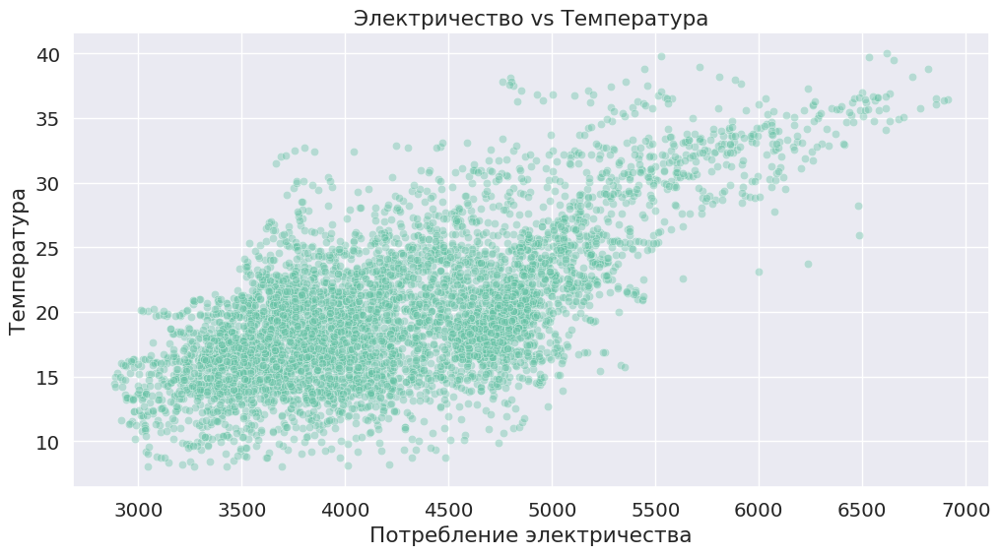

In [6]:
plt.figure(figsize=(12, 6))
sns.scatterplot(x=data["Consumption"], y=data["Temperature"], alpha=0.4)
plt.title("Электричество vs Температура")
plt.xlabel("Потребление электричества")
plt.ylabel("Температура")


Теперь посмотрим на коэффициент корреляции и значимость

In [7]:
sps.spearmanr(data["Temperature"], data["Consumption"])

SignificanceResult(statistic=0.5780541860694933, pvalue=0.0)

Значит, данные скоррелированы - это видно и графически и из коэффициентов корреляции (они значимы) - причем положительная корреляция

__3.__ Разделите временной ряд на две части:
данные за последнюю неделю (последние $48\times7$ измерений) назовем тестовыми данными, а все остальное &mdash; обучающими данными.

In [8]:
end_test = data['Time'].max()
start_test = end_test - pd.Timedelta(days=7)

train = data[data['Time'] < start_test]
test = data[data['Time'] >= start_test]

test

,Consumption,Temperature,DailySeasonality,WeeklySeasonality,Time
5183,4317.386273,14.75,47,191,2000-04-26 23:30:00
5184,4154.970201,14.30,0,192,2000-04-27 00:00:00
5185,4008.652480,13.90,1,193,2000-04-27 00:30:00
5186,4210.425512,13.50,2,194,2000-04-27 01:00:00
5187,4120.652307,13.65,3,195,2000-04-27 01:30:00
...,...,...,...,...,...
5515,4410.631913,14.70,43,187,2000-05-03 21:30:00
5516,4292.029885,14.60,44,188,2000-05-03 22:00:00
5517,4231.380523,14.65,45,189,2000-05-03 22:30:00
5518,4587.536047,14.70,46,190,2000-05-03 23:00:00


*Замечание. Пункты c аналитикой выполните для обучающих данных.*

__4__. Сколько типов сезонностей можно выделить в каждом из двух рядов &mdash; спрос на электричество и температура?
С помощью STL-декомпозиции и с помощью декомпозиции, основанной на скользящих средних, в каждом ряде выделите тренд, все типы сезонности, остатки. Сравните 2 метода друг с другом.

**Температура**

*Дневные тренды* - других быть не может. Для годовой недостаточно данных, а недели связаны с активностью человека, но не природы - ее искать не надо

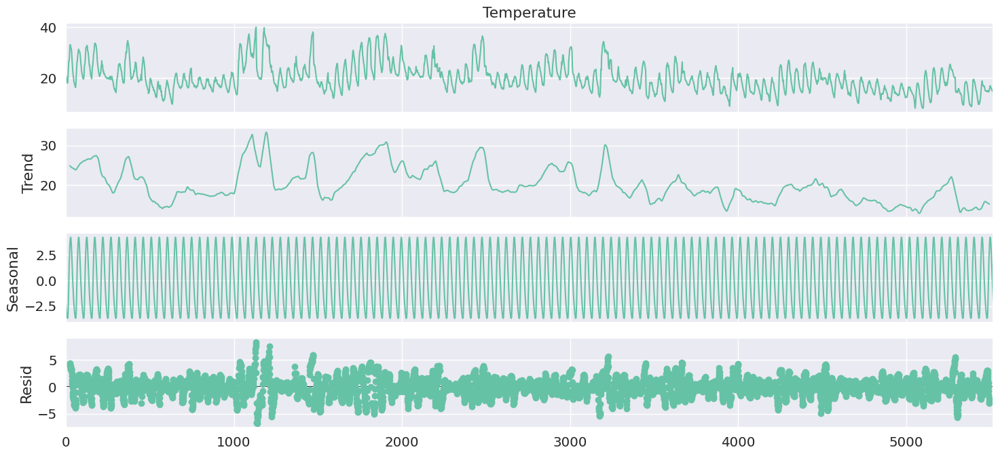

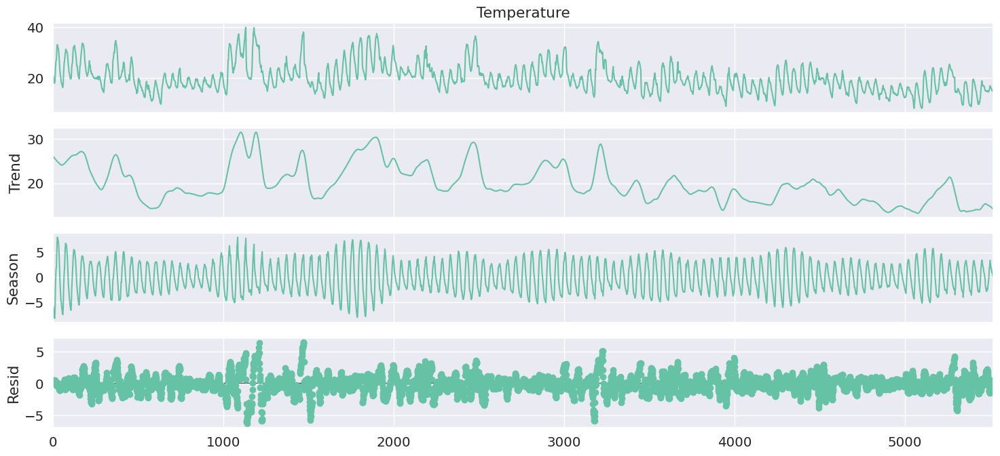

In [9]:
simple_result = seasonal_decompose(data["Temperature"], model="additive", period=24 * 2)
simple_result.plot()

stl_result = STL(data["Temperature"], period=24 * 2).fit()
stl_result.plot()

stl_temp_daily = stl_result
plt.show()

Сравним ошибки

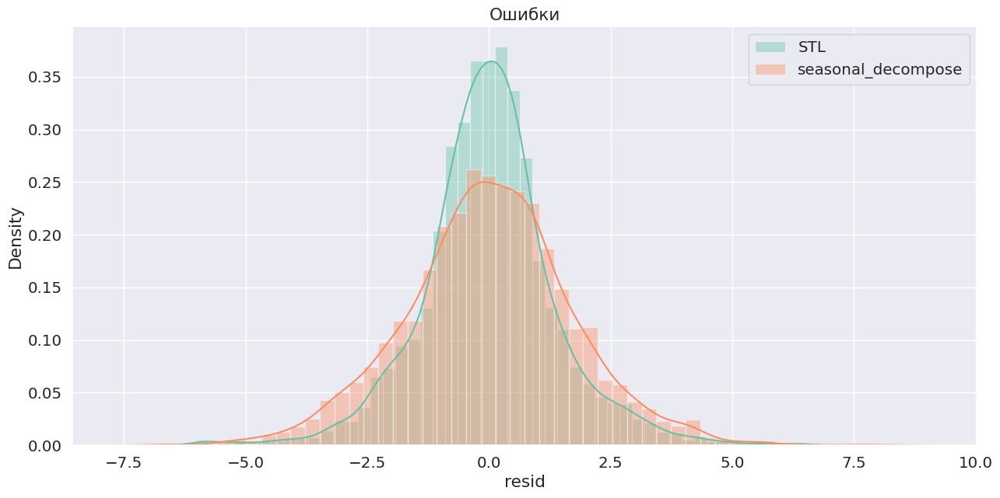

In [10]:
plt.title("Ошибки")

sns.distplot(stl_result.resid, label="STL")
sns.distplot(simple_result.resid, label="seasonal_decompose")
plt.legend()
plt.show()

**Вывод по температуре:**

Есть дневная сезонность, у остатков по STL меньше дисперсия - STL лучше

**Сезонность по потреблению**

Видны на графике ряда недельные и дневные тренды, проверим *дневные*

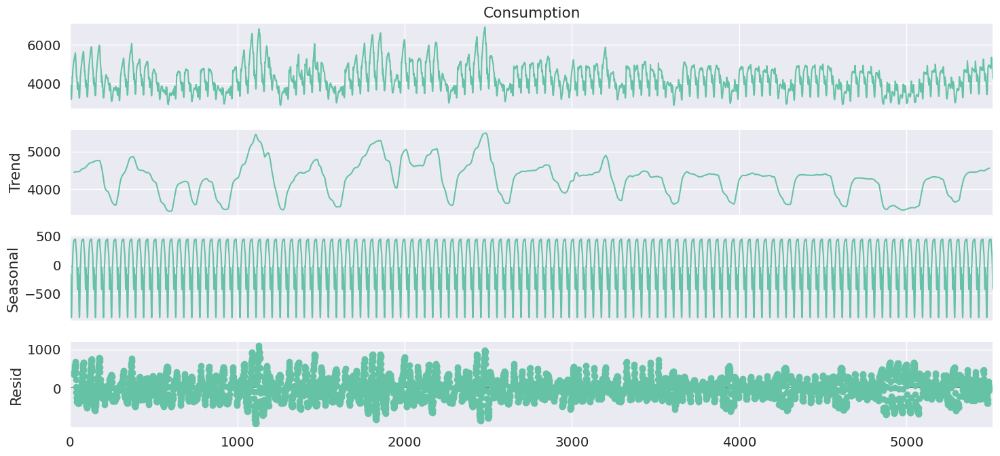

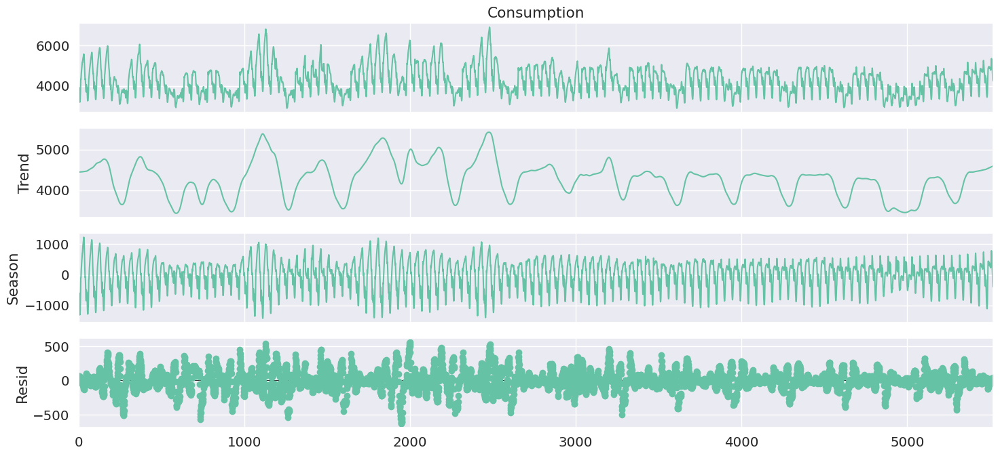

In [11]:
simple_result = seasonal_decompose(data["Consumption"], model="additive", period=24 * 2)
simple_result.plot()

stl_result = STL(data["Consumption"], period=24 * 2).fit()
stl_result.plot()

stl_cons_daily = stl_result
plt.show()

Остатки

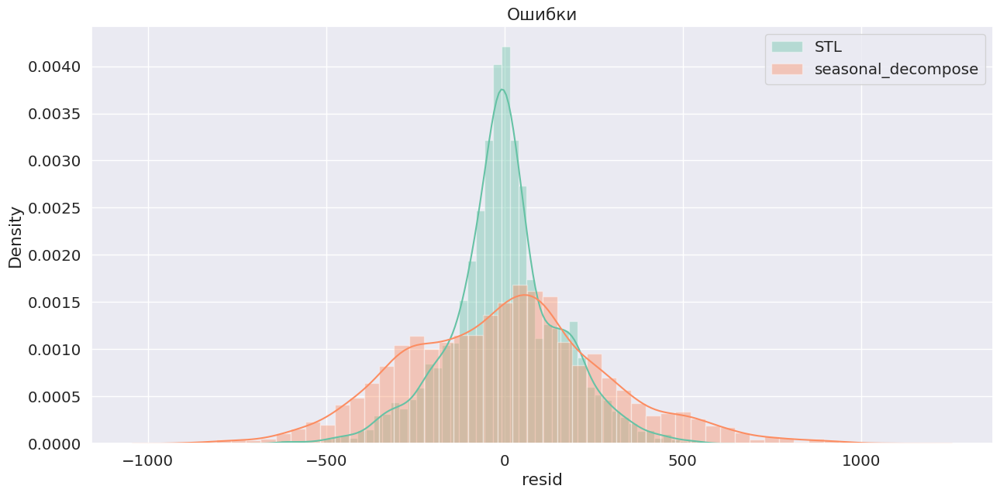

In [12]:
plt.title("Ошибки")

sns.distplot(stl_result.resid, label="STL")
sns.distplot(simple_result.resid, label="seasonal_decompose")
plt.legend()
plt.show()

Проверим недельный тренд, но сначала нужно будет выкинуть дневную сезонность

In [13]:
simple_result = seasonal_decompose(data["Consumption"] - stl_result_day_cons.seasonal,
                                   model="additive",
                                   period=24 * 2)
simple_result.plot()

stl_result = STL(data["Consumption"]- stl_result_day_cons.seasonal,
                 period=24 * 2).fit()

stl_cons_weekly = stl_result
stl_result.plot()
plt.show()

NameError: name 'stl_result_day_cons' is not defined

Остатки

In [ ]:
plt.title("Ошибки")

sns.distplot(stl_result.resid, label="STL")
sns.distplot(simple_result.resid, label="seasonal_decompose")
plt.legend()
plt.show()

**Выводы по потреблению энергии:**

Есть недельная и дневная сезонность; STL лучше ловит дневную сезонность, но недельную они ловят одинаково хорошо (дневная сезонность по сезонной части STL достаточно точная - ровно за счет этого они одинаково хорошо ловят недельную, поэтому лучше выбирать STL)

__5.__ С помощью критериев KPSS и Дики-Фуллера проверьте на стационарность исходные ряды и остатки, полученные после применения STL-декомпозиции. Не забывайте про множественную проверку гипотез.

In [ ]:
series_list = [("Original Consumption", data["Consumption"]),
               ("Consumption Residuals (daily)", stl_cons_daily.resid),
               ("Consumption Residuals (weekly)", stl_cons_weekly.resid),
               ("Original Temperature", data["Temperature"]),
               ("Temperature Residuals (weekly)", stl_temp_daily.resid),]

corrected_p = multipletests(
    [p for name, series in series_list for p in 
     (adfuller(series)[1], kpss(series)[1])], 
    method="holm"
)[1]

df_results = pd.DataFrame([
    {
        "Series": name,
        "ADF p-value": corrected_p[i * 2], 
        "KPSS p-value": corrected_p[i * 2 + 1]
    } for i, (name, _) in enumerate(series_list)
])

df_results

KPSS лучше видит отсутствие сезонностей которые мы видели визуально, лучше доверять ему. Итого с МПГ получаем, что исходные ряды не стационарны, а остатки - да (и дневные, и недельные)

__6.__ С помощью экспоненциального сглаживания, модели Хольта и модели Хольта-Уинтерса постройте прогнозы моделей с оптимальными параметрами для *спроса на электричество* на неделю вперед. Как можно выбирать параметр сглаживания $\alpha$? Посчитайте качество прогноза по сравнению с реальными данными на тестовом интервале, используя метрику MSE. Сравните все предсказания.

Исходные графики

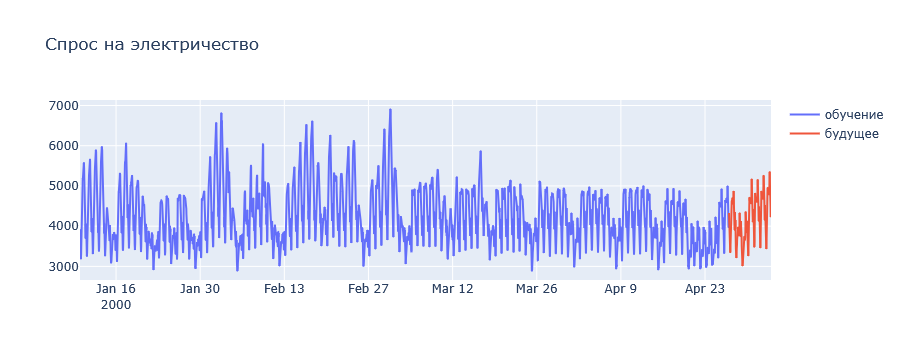

In [14]:
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        y=train['Consumption'], x=train['Time'], mode="lines", name="обучение"
    )
)
fig.add_trace(
    go.Scatter(
        y=test['Consumption'],
        x=test['Time'],
        mode="lines",
        name="будущее",
    )
)
fig.update_layout(title='Спрос на электричество')
fig.show()

Параметр $\alpha$ подбирать надо кросс-валидаций как и любой другой гиперапараметр

Посмотрим на $\alpha = 0.2, 0.6$ и автоматический выбор моделью

In [15]:
sf_fit1 = SimpleExponentialSmoothing(alpha=0.2).fit(train['Consumption'].values)
sf_fit2 = SimpleExponentialSmoothing(alpha=0.6).fit(train['Consumption'].values)
sf_fit3 = SimpleExponentialSmoothingOptimized().fit(train['Consumption'].values)

sf_fcast1 = sf_fit1.predict(len(test))["mean"]
sf_fcast2 = sf_fit2.predict(len(test))["mean"]
sf_fcast3 = sf_fit3.predict(len(test))["mean"]

Результат моделей в виде таблицы

In [16]:
sf_labels = ["sf alpha=0.2", "sf alpha=0.6", f"sf alpha=auto"]

print("\nStatsforecast results:\n")
sf_labels = ["sf alpha=0.2", "sf alpha=0.6", f"sf alpha=auto"]
results = pd.DataFrame(index=["test MSE"], columns=sf_labels)
for index in [1, 2, 3]:
    results[sf_labels[index - 1]]["test MSE"] = round(mean_squared_error(
        test['Consumption'], globals()[f"sf_fcast{index}"]
    ))
display(results)


Statsforecast results:



,sf alpha=0.2,sf alpha=0.6,sf alpha=auto
test MSE,293618,287620,296222


На графике

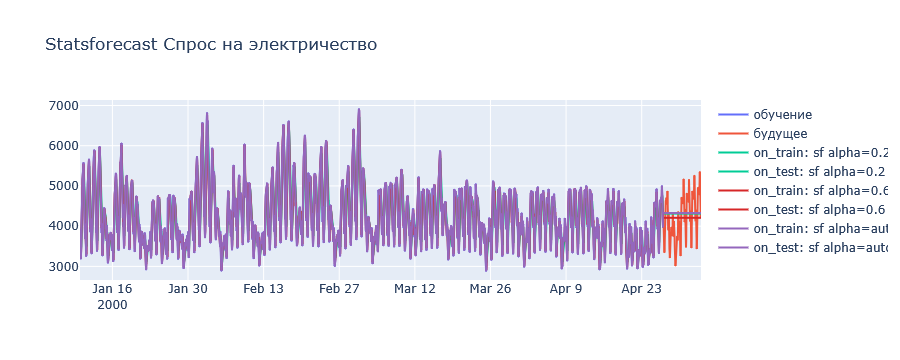

In [17]:
colors = list(["#00cc96", "#d62728", "#9467bd", "#8c564b"])

fig = go.Figure()
fig.add_trace(
    go.Scatter(
        y=train['Consumption'], x=train['Time'], mode="lines", name="обучение"
    )
)
fig.add_trace(
    go.Scatter(
        y=test['Consumption'],
        x=test['Time'],
        mode="lines",
        name="будущее",
    )
)


for index in [1, 2, 3]:
    on_train = globals()[f"sf_fit{index}"].model_["fitted"]
    on_test = globals()[f"sf_fcast{index}"]

    for dataset_str, x_index in zip(
        ["on_train", "on_test"], [train['Time'], test['Time']]
    ):
        dataset = globals()[dataset_str]
        label = dataset_str + ": " + sf_labels[index - 1]
        fig.add_trace(
            go.Scatter(
                x=x_index,
                y=list(dataset),
                line=dict(color=colors[index - 1]),
                mode="lines",
                name=label,
            )
        )

fig.update_layout(title="Statsforecast " + 'Спрос на электричество')
fig.show()

Добавим результат в таблицу

In [18]:
def add_results_in_comparison_table(
    method: str, y_true, y_forecast
) -> pd.DataFrame:
    """
    Добавляет новую строчку в таблицу compare_table
    с результатами текущей модели.

    Если ранее модель была уже добавлена в таблицу,
    то старая строчка перезапишется на новую.

    Параметры:
    - method: имя модели.
    - y_true: истинные значения.
    - y_forecast: предсказанные значения.
    """

    # Обращаемся к глобальной переменной
    global compare_table

    # Считаем метрики
    result_row = {
        "method": method,
        "MSE": mean_squared_error(
            y_true=y_true, y_pred=y_forecast
        ),
        "MAE": mean_absolute_error(
            y_true=y_true, y_pred=y_forecast
        ),
        "MAPE": mean_absolute_percentage_error(
            y_true=y_true, y_pred=y_forecast
        ),
    }

    # Записываем результат в таблицу
    if compare_table is None:
        compare_table = pd.DataFrame([result_row])
    else:
        if method in list(compare_table["method"]):
            compare_table = compare_table[
                compare_table["method"] != method
            ]

        compare_table = pd.concat(
            [compare_table, pd.DataFrame([result_row])]
        )
        compare_table.index = np.arange(len(compare_table))
    return compare_table

compare_table = None

Итого

In [19]:
for i in range(3):
    add_results_in_comparison_table(
        "ExpSmoothing " + sf_labels[i],
        test["Consumption"],
         globals()[f"sf_fcast{i + 1}"]
    )

compare_table

,method,MSE,MAE,MAPE
0,ExpSmoothing sf alpha=0.2,293618.347934,461.226047,0.115708
1,ExpSmoothing sf alpha=0.6,287619.645048,463.905055,0.113527
2,ExpSmoothing sf alpha=auto,296222.130198,461.630165,0.116197


Holt

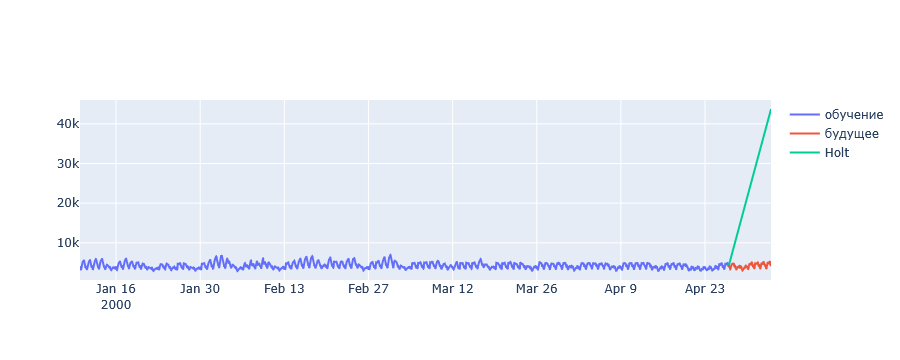

In [20]:
model = Holt(train["Consumption"]).fit()
prediction = model.forecast(steps=len(test))

fig = go.Figure()
fig.add_trace(
    go.Scatter(
        y=train['Consumption'], x=train['Time'], mode="lines", name="обучение"
    )
)
fig.add_trace(
    go.Scatter(
        y=test['Consumption'],
        x=test['Time'],
        mode="lines",
        name="будущее",
    )
)
fig.add_trace(
    go.Scatter(
        y=prediction,
        x=test['Time'],
        mode="lines",
        name="Holt",
    )
)

И качество

In [21]:
add_results_in_comparison_table(
    "Holt",
    test["Consumption"],
    prediction
)

compare_table

,method,MSE,MAE,MAPE
0,ExpSmoothing sf alpha=0.2,2.936183e+05,461.226047,0.115708
1,ExpSmoothing sf alpha=0.6,2.876196e+05,463.905055,0.113527
2,ExpSmoothing sf alpha=auto,2.962221e+05,461.630165,0.116197
3,Holt,5.186982e+08,19862.191112,4.635071


Хольт-Уинтерс

In [22]:
model = ExponentialSmoothing(
    train["Consumption"],
    seasonal_periods=24 * 2 * 7,
    seasonal="add",
    trend="add",
    damped_trend=True,
).fit()
prediction = model.forecast(steps=len(test))

fig = go.Figure()
fig.add_trace(
    go.Scatter(
        y=train['Consumption'], x=train['Time'], mode="lines", name="обучение"
    )
)
fig.add_trace(
    go.Scatter(
        y=test['Consumption'],
        x=test['Time'],
        mode="lines",
        name="будущее",
    )
)
fig.add_trace(
    go.Scatter(
        y=prediction,
        x=test['Time'],
        mode="lines",
        name="Holt Winters",
    )
)

Качество

In [23]:
add_results_in_comparison_table(
    "Holt Winters",
    test["Consumption"],
    prediction
)

compare_table

,method,MSE,MAE,MAPE
0,ExpSmoothing sf alpha=0.2,2.936183e+05,461.226047,0.115708
1,ExpSmoothing sf alpha=0.6,2.876196e+05,463.905055,0.113527
2,ExpSmoothing sf alpha=auto,2.962221e+05,461.630165,0.116197
3,Holt,5.186982e+08,19862.191112,4.635071
4,Holt Winters,9.018903e+05,856.191826,0.203251


Все модели дали плохое результат. Holt Winters систематически занижает предсказание. Holt ведет себя неадекватно

Естественно лучше выбрать $\alpha$ кросс-валидацией

__7.__ Построим модель $\text{SARIMA}$ для предсказания *спроса на электричество*. С помощью преобразований исходного ряда приведите его к стационарному. По графикам ACF и PACF подберите параметры модели $\text{SARIMA}(p, d, q)\times(P, D, Q)_s$. 

*Замечание. Для ускорения вычислений рекомендуется сделать сначала ресэмплинг данных по часам. Подумайте, с каким количеством сезонностей может работать модель $\text{SARIMA}$? Какие типы сезонностей у нас в данных? Для экономии времени и вычислительных ресурсов рекомендуется аккуратно подходить к выбору $P$ и $Q$.*

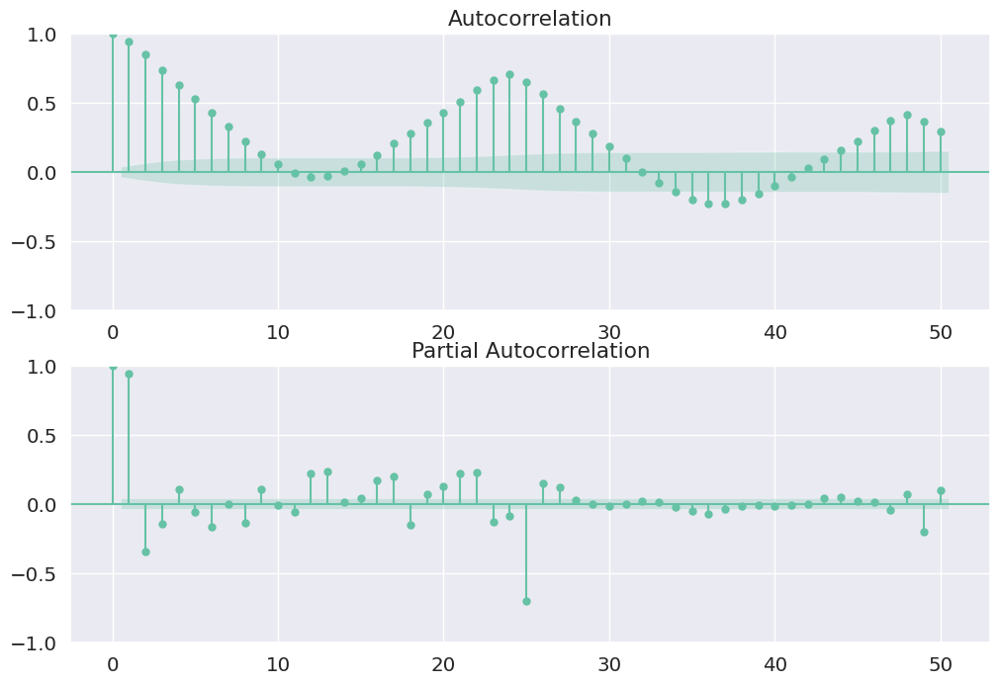

In [24]:
train_cp = train.copy()
train_cp = train_cp.set_index('Time')
сonsumption = train_cp["Consumption"].resample("H").sum().values

fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(сonsumption, lags=50, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(сonsumption, lags=50, ax=ax2)
plt.show()

Видна сезонность по дням, убираем ее 

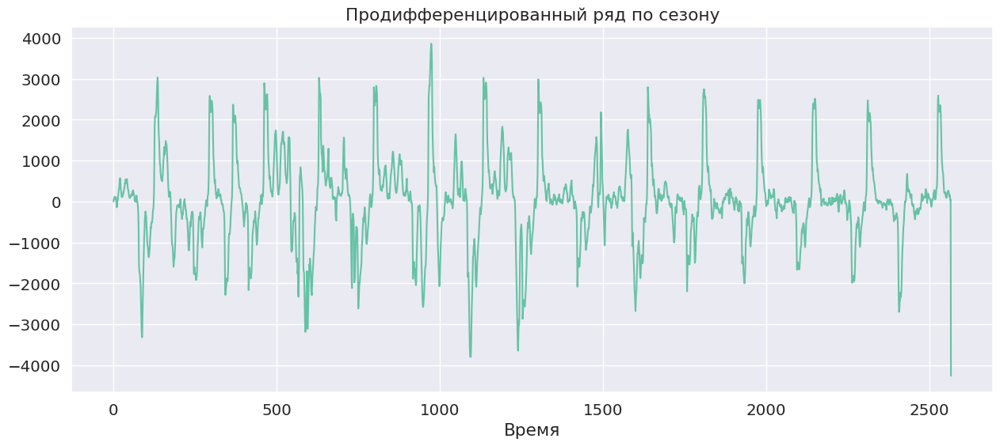

In [25]:
сonsumption_ts = сonsumption[24:] - сonsumption[:-24]

plt.figure(figsize=(15, 6))
plt.plot(сonsumption_ts)
plt.xlabel("Время")
plt.title("Продифференцированный ряд по сезону")
plt.show()

Теперь корреляции

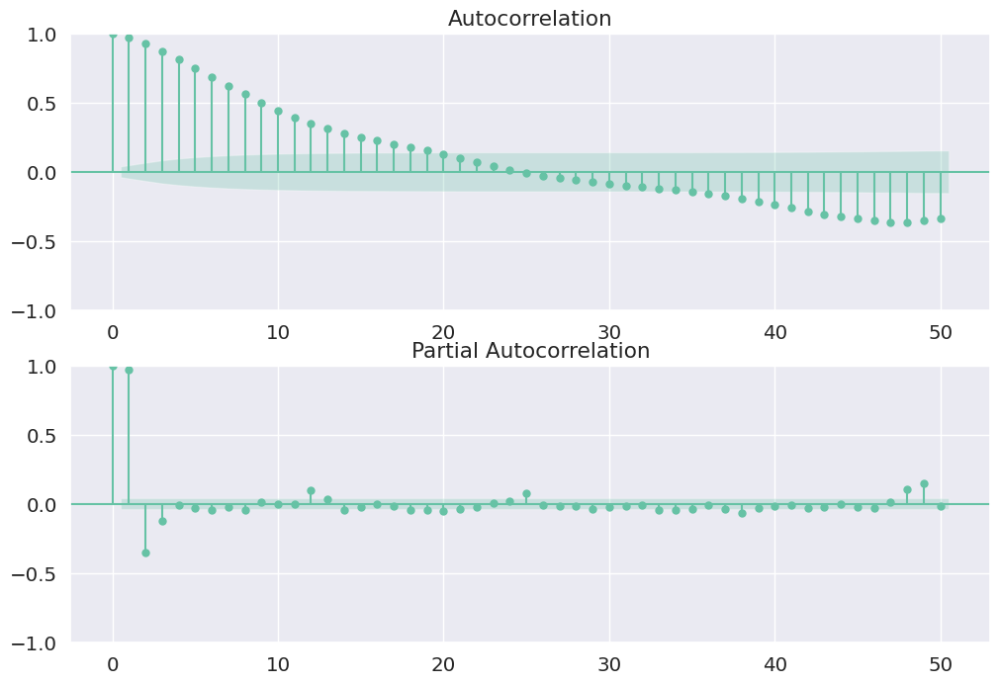

In [26]:
fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(сonsumption_ts, lags=50, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(сonsumption_ts, lags=50, ax=ax2)
plt.show()

Виден тренд. Убираем его дифференцированием

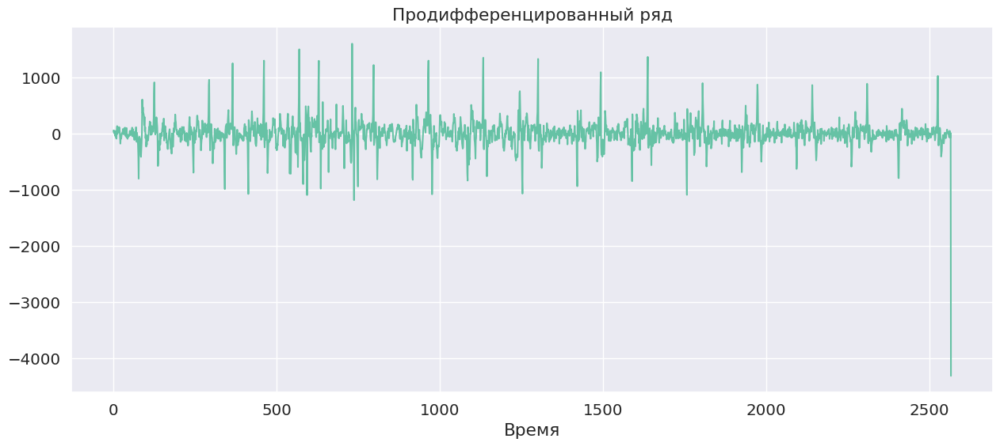

In [27]:
сonsumption_ts_t = сonsumption_ts[1:] - сonsumption_ts[:-1]  # дифференцирование

plt.figure(figsize=(15, 6))
plt.plot(сonsumption_ts_t)
plt.xlabel("Время")
plt.title("Продифференцированный ряд")
plt.show()

Корреляции

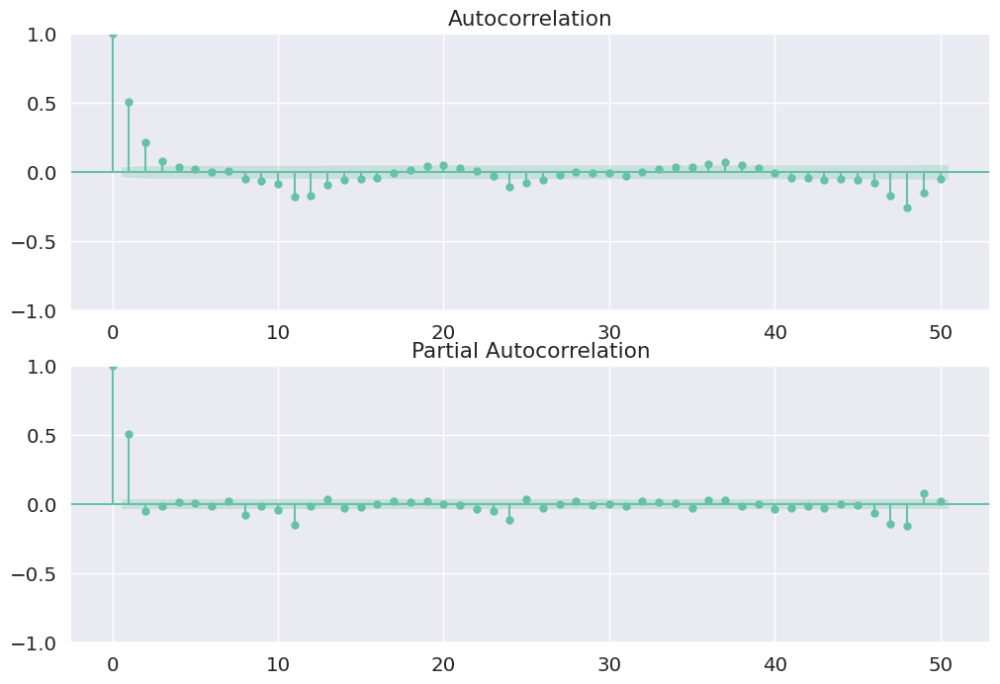

In [28]:
fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(сonsumption_ts_t, lags=50, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(сonsumption_ts_t, lags=50, ax=ax2)
plt.show()

Теперь стационарность видна. Берем p ~ 3, q ~ 3 и d = 1 (p, q из значимых значений в корреляциях). Теперь подберем P D Q из сезонных лагов кратных 24 (дневная сезонность)

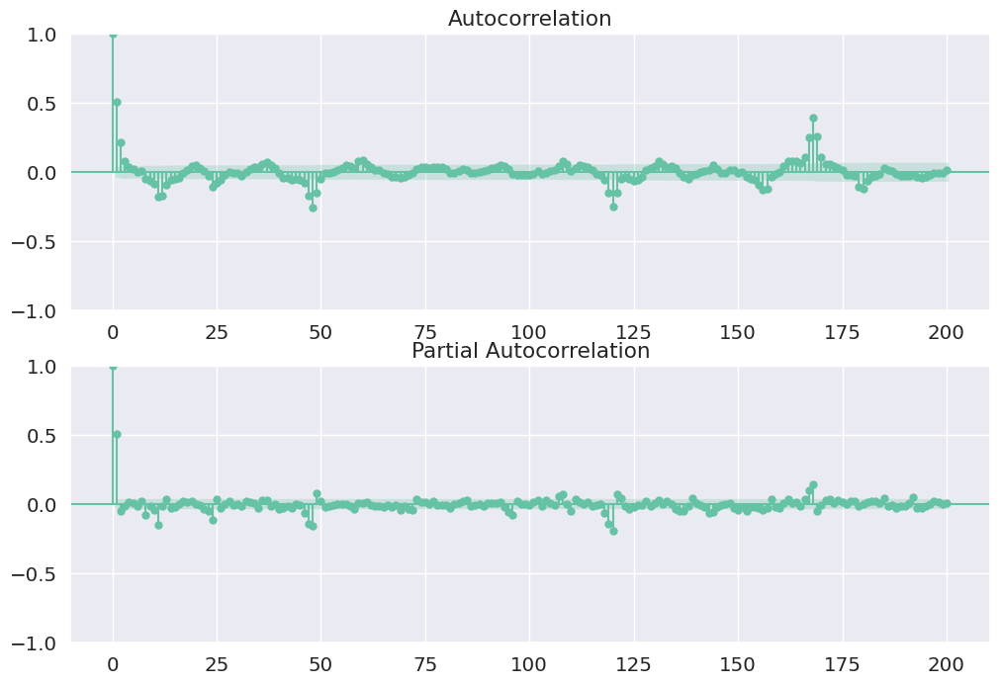

In [29]:
fig = plt.figure(figsize=(12, 8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(сonsumption_ts_t, lags=200, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(сonsumption_ts_t, lags=200, ax=ax2)
plt.show()

Можно взять P ~ 2, Q ~ 2, и ясно что D = 1. Осталось покрутить соседние гиперпараметры и посмотреть что выйдет более оптимальным

__8.__  С помощью поиска по сетке вокруг выбранных параметров подберите оптимальные параметры по значению AIC. Учтите, что из сделанных ранее преобразований ряда нужно оставить лишь некоторые. Другие, например, одна из сезонностей будут учтены параметрами модели. Для вашего удобства рекомендуется сохранять промежуточные результаты, например, в какой-нибудь файл.

Итого

In [ ]:
import pmdarima as pm

pm.auto_arima(
    сonsumption,
    trace=True,
    start_p=1,
    max_p=4,
    start_q=1,
    max_q=4,
    max_d=1,
    start_P=1,
    max_P=3,
    max_D=1,
    start_Q=1,
    max_Q=3,
    suppress_warnings=True,
    maxiter=500,
    m=24,
    n_jobs=-1,
    parallel=True
)

Лучшая модель

order=(2, 2, 1),
seasonal_order=(3, 1, 1, 24),

Не забудем поменять сезонность

__9.__ Постройте прогнозы модели с оптимальными параметрами на неделю вперед. Посчитайте качество прогноза по сравнению с реальными данными на тестовом интервале, используя метрику MSE.

In [33]:
model = sm.tsa.statespace.SARIMAX(
    train["Consumption"],
    order=(2, 2, 1),
    seasonal_order=(3, 1, 1, 48),
    enforce_stationarity=False,
    enforce_invertibility=False,
)
model = model.fit(disp=False, method="lbfgs", maxiter=200)

Предсказание

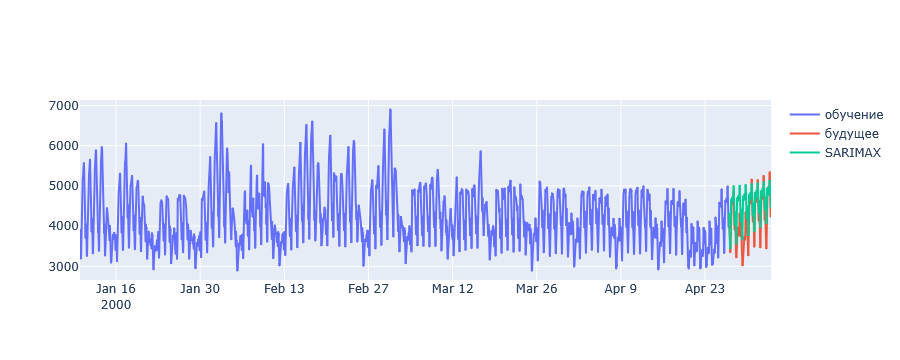

In [34]:
prediction = model.forecast(steps=len(test))

fig = go.Figure()
fig.add_trace(
    go.Scatter(
        y=train['Consumption'], x=train['Time'], mode="lines", name="обучение"
    )
)
fig.add_trace(
    go.Scatter(
        y=test['Consumption'],
        x=test['Time'],
        mode="lines",
        name="будущее",
    )
)
fig.add_trace(
    go.Scatter(
        y=prediction,
        x=test['Time'],
        mode="lines",
        name="SARIMAX",
    )
)

Качество

In [35]:
add_results_in_comparison_table(
    "SARIMAX",
    test["Consumption"],
    prediction
)

compare_table

,method,MSE,MAE,MAPE
0,ExpSmoothing sf alpha=0.2,2.936183e+05,461.226047,0.115708
1,ExpSmoothing sf alpha=0.6,2.876196e+05,463.905055,0.113527
2,ExpSmoothing sf alpha=auto,2.962221e+05,461.630165,0.116197
3,Holt,5.186982e+08,19862.191112,4.635071
4,Holt Winters,9.018903e+05,856.191826,0.203251
5,SARIMAX,2.149647e+05,333.376367,0.087541


Качество значительно улучшилось

__10.__ Добавьте в модель предсказания электричества экзогенные факторы:
* Значения температуры, используя на тестовом интервале времени истинные значения температуры (*нечестный способ*).
* Значения температуры, используя на тестовом интервале времени предсказания значений температуры. Предсказания можно получить с помощью модели Хольта-Уинтерса, `pmdarima.arima.auto_arima` или `statsforecast.models.AutoARIMA`.
* Использование значений температуры по частям &mdash; для получения прогноза $\widehat{y}_{T+h|T}$ строится своя модель по временному ряду $y_{h}, ..., y_T$ со сдвинутым влево рядом экзогенного фактора $x_{1}, ..., x_{T-h}$. Тогда для получения прогноза $\widehat{y}_{T+h|T}$ нужно знать значения $x_{T-h+1}, ..., x_{T}$, которые известны на момент построения модели.

Первая

In [38]:
model_1 = sm.tsa.statespace.SARIMAX(
    train["Consumption"],
    exog=train[["Temperature"]],
    order=(2, 2, 1),
    seasonal_order=(3, 1, 1, 48),
    enforce_stationarity=False,
    enforce_invertibility=False,
)
model_1 = model_1.fit(disp=False, method="lbfgs", maxiter=200)

prediction_1 = model.forecast(
    steps=len(test), exog=test[["Temperature"]]
)

Вторая

In [39]:
holt = ExponentialSmoothing(
    train["Temperature"],
    seasonal_periods=48,
    seasonal="add",
    trend="add",
    damped_trend=True,
).fit(smoothing_level=0.2, smoothing_trend=0.2, smoothing_seasonal=0.2)
holt_pred = holt.forecast(steps=len(test))

model_2 = sm.tsa.statespace.SARIMAX(
    train["Consumption"],
    exog=train[["Temperature"]],
    order=(2, 2, 1),
    seasonal_order=(3, 1, 1, 48),
    enforce_stationarity=False,
    enforce_invertibility=False,
)
model_2 = model_2.fit(disp=False, method="lbfgs", maxiter=200)
prediction_2 = model.forecast(
    steps=len(test), exog=holt_pred
)

/home/juequ/.local/lib/python3.10/site-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



Третья

In [40]:
model_3 = sm.tsa.statespace.SARIMAX(
    train["Consumption"].iloc[len(test):],
    exog=train[["Temperature"]][:-len(test)].values,
    order=(2, 2, 1),
    seasonal_order=(3, 1, 1, 48),
    enforce_stationarity=False,
    enforce_invertibility=False,
)
model_3 = model_3.fit(disp=False, method="lbfgs", maxiter=200)
prediction_3 = model.forecast(
    steps=len(test),
    exog=train[["Temperature"]].iloc[-len(test):].values,
)

/home/juequ/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.

/home/juequ/.local/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning:

An unsupported index was provided. As a result, forecasts cannot be generated. To use the model for forecasting, use one of the supported classes of index.



Графики

In [41]:
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        y=train['Consumption'], x=train['Time'], mode="lines", name="обучение"
    )
)
fig.add_trace(
    go.Scatter(
        y=test['Consumption'],
        x=test['Time'],
        mode="lines",
        name="будущее",
    )
)

predictions = [prediction_1, prediction_2, prediction_3]
names = [
    "SARIMAX with test temp",
    "SARIMAX with test temp prediction Holt",
    "SARIMAX with temp current",
]

for pred, name in zip(predictions, names):
    fig.add_trace(go.Scatter(y=pred, x=test['Time'], mode="lines", name=name))

Качество

In [43]:
for model, pred in zip(names, predictions):
    add_results_in_comparison_table(model, test["Consumption"], pred)

compare_table

,method,MSE,MAE,MAPE
0,ExpSmoothing sf alpha=0.2,2.936183e+05,461.226047,0.115708
1,ExpSmoothing sf alpha=0.6,2.876196e+05,463.905055,0.113527
2,ExpSmoothing sf alpha=auto,2.962221e+05,461.630165,0.116197
3,Holt,5.186982e+08,19862.191112,4.635071
4,Holt Winters,9.018903e+05,856.191826,0.203251
5,SARIMAX,2.149647e+05,333.376367,0.087541
6,SARIMAX with test temp,2.149647e+05,333.376367,0.087541
7,SARIMAX with test temp prediction Holt,2.149647e+05,333.376367,0.087541
8,SARIMAX with temp current,2.149647e+05,333.376367,0.087541


Предсказание почти не изменилось. Нужно дольше обучать модель, а она с текущими параметрами и так слишком долго обучается. К сожалению, с большим числом итераций не получится заслать домашку.

__11.__ Постройте предсказания временного ряда для электричества, используя библиотеку `prophet`. Визуализируйте предсказания и отдельные его компоненты.

In [44]:
prophet_train_df = pd.DataFrame(
    {"ds": train["Time"], "y": train["Consumption"]}
)
prophet_model = Prophet(interval_width=0.95)
prophet_model.fit(prophet_train_df)

01:37:57 - cmdstanpy - INFO - Chain [1] start processing
01:37:58 - cmdstanpy - INFO - Chain [1] done processing


Предсказание

In [46]:
future = prophet_model.make_future_dataframe(
    freq="30T", periods=len(test), include_history=False
)
prophet_prediction = prophet_model.predict(future)

Компонентны

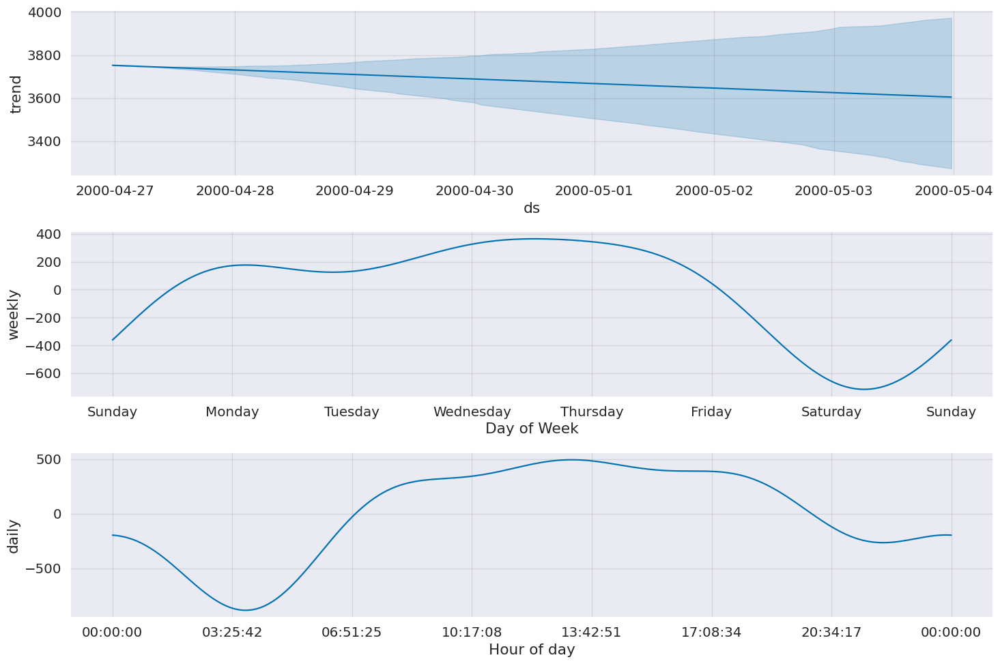

In [47]:
prophet_model.plot_components(prophet_prediction, figsize=(15, 10))
plt.show()

предсказание

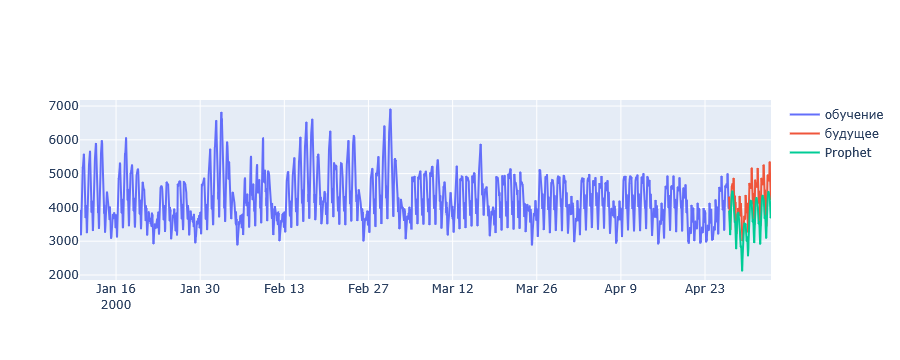

In [48]:
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        y=train['Consumption'], x=train['Time'], mode="lines", name="обучение"
    )
)
fig.add_trace(
    go.Scatter(
        y=test['Consumption'],
        x=test['Time'],
        mode="lines",
        name="будущее",
    )
)

fig.add_trace(
    go.Scatter(
        y=prophet_prediction["yhat"],
        x=test['Time'],
        mode="lines",
        name="Prophet",
    )
)

Качество

In [49]:
add_results_in_comparison_table(
    "Prophet",
    test["Consumption"],
    prophet_prediction["yhat"]
)

compare_table

,method,MSE,MAE,MAPE
0,ExpSmoothing sf alpha=0.2,2.936183e+05,461.226047,0.115708
1,ExpSmoothing sf alpha=0.6,2.876196e+05,463.905055,0.113527
2,ExpSmoothing sf alpha=auto,2.962221e+05,461.630165,0.116197
3,Holt,5.186982e+08,19862.191112,4.635071
4,Holt Winters,9.018903e+05,856.191826,0.203251
5,SARIMAX,2.149647e+05,333.376367,0.087541
6,SARIMAX with test temp,2.149647e+05,333.376367,0.087541
7,SARIMAX with test temp prediction Holt,2.149647e+05,333.376367,0.087541
8,SARIMAX with temp current,2.149647e+05,333.376367,0.087541
9,Prophet,3.925128e+05,554.939588,0.130929


__12.__ Сравните все предсказания по метрике MSE. Какая модель оказалась лучшей? Сделайте выводы.

In [50]:
compare_table

,method,MSE,MAE,MAPE
0,ExpSmoothing sf alpha=0.2,2.936183e+05,461.226047,0.115708
1,ExpSmoothing sf alpha=0.6,2.876196e+05,463.905055,0.113527
2,ExpSmoothing sf alpha=auto,2.962221e+05,461.630165,0.116197
3,Holt,5.186982e+08,19862.191112,4.635071
4,Holt Winters,9.018903e+05,856.191826,0.203251
5,SARIMAX,2.149647e+05,333.376367,0.087541
6,SARIMAX with test temp,2.149647e+05,333.376367,0.087541
7,SARIMAX with test temp prediction Holt,2.149647e+05,333.376367,0.087541
8,SARIMAX with temp current,2.149647e+05,333.376367,0.087541
9,Prophet,3.925128e+05,554.939588,0.130929


SARIMAX оказалась наилучшей, Prophet сильно отсатает